In [ ]:
# Cloning YOLOv5 Github Repository, Installing Requirements & Roboflow.

!git clone https://github.com/ultralytics/yolov5
%cd yolov5

%pip install -qr requirements.txt
%pip install -q roboflow

import torch
import os

Cloning into 'yolov5'...
remote: Enumerating objects: 15997, done.
remote: Counting objects: 100% (30/30), done.
remote: Compressing objects: 100% (18/18), done.
remote: Total 15997 (delta 19), reused 18 (delta 12), pack-reused 15967
Receiving objects: 100% (15997/15997), 14.64 MiB | 24.79 MiB/s, done.
Resolving deltas: 100% (10981/10981), done.
/content/yolov5
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 190.0/190.0 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.5/615.5 kB 27.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 1.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.1/49.1 MB 17.6 MB/s eta

In [ ]:
# Importing Roboflow and Downloading the Dataset from Roboflow using API.

from roboflow import Roboflow

rf = Roboflow(api_key="L9fEKqETvPmJUyonNsAZ")
project = rf.workspace("ahsanoid").project("road_detection-vz7oa")
dataset = project.version(1).download("yolov5")

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to road_detection-1 in yolov5pytorch:: 100%|██████████| 419/419 [00:00<00:00, 2782.20it/s]


In [ ]:
# Training the Dataset on Pre-trained YOLO v5 Medium Weights.

!python train.py --img 640 --epochs 120 --data {dataset.location}/data.yaml --weights yolov5m.pt

train: weights=yolov5m.pt, cfg=, data=/content/yolov5/road_detection-1/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=120, batch_size=16, imgsz=640, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, noplots=False, evolve=None, bucket=, cache=None, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, seed=0, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v7.0-224-g6262c7f Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv

In [ ]:
# Displaying Tensorboard

%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

In [ ]:
# Testing on the Validation Dataset

!python detect.py --weights runs/train/exp2/weights/best.pt --img 640 --conf 0.15 --source {dataset.location}/valid/images

detect: weights=['runs/train/exp2/weights/best.pt'], source=/content/yolov5/road_detection-1/valid/images, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.15, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-224-g6262c7f Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
Model summary: 212 layers, 20865057 parameters, 0 gradients, 47.9 GFLOPs
image 1/7 /content/yolov5/road_detection-1/valid/images/IMG_8718_JPG.rf.bba14bc97990c31735f56060e2db7e6d.jpg: 640x640 1 left, 2 rights, 27.0ms
image 2/7 /content/yolov5/road_detection-1/valid/images/IMG_8722_JPG.rf.0aead9572b888e9c428dfc14c219cdc9.jpg: 640x640 1 left, 1 straight, 27.0ms
image 3/7 /con

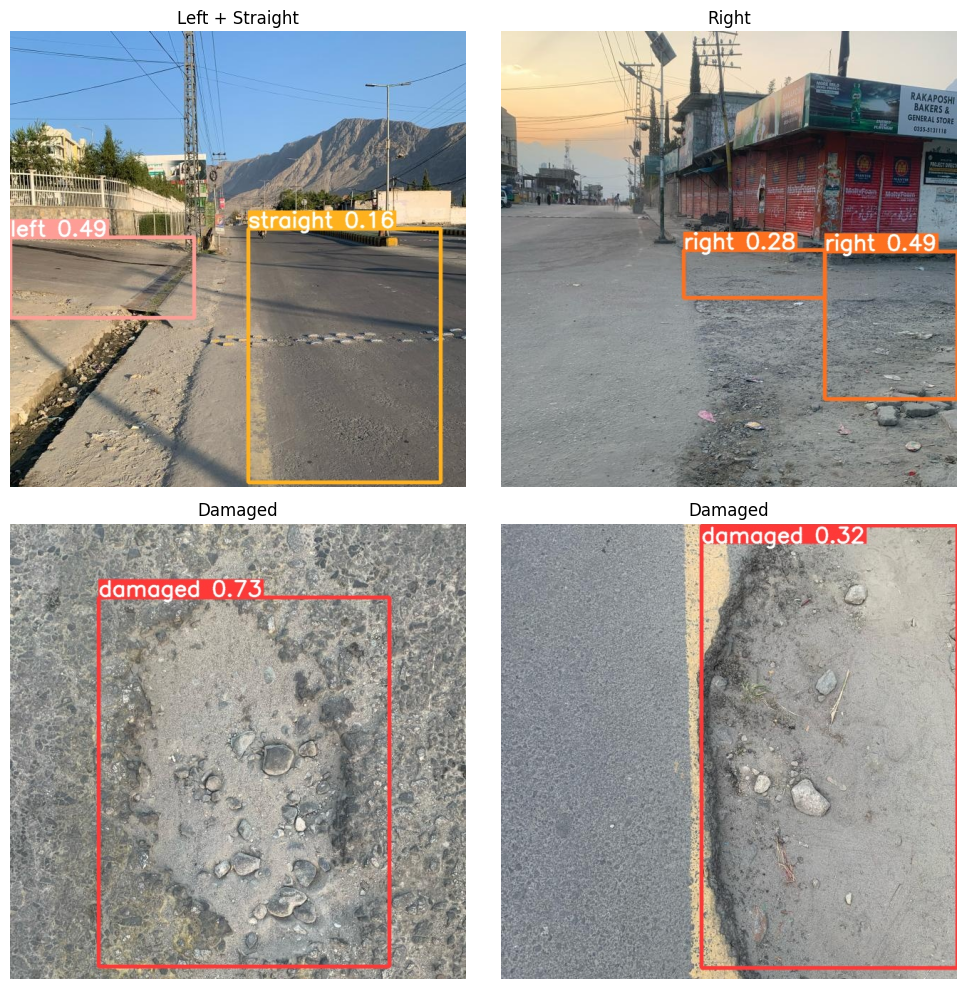

In [ ]:
# Displaying the Detected Images

import matplotlib.pyplot as plt
from PIL import Image

files_and_titles = {
    '/content/yolov5/runs/detect/exp2/IMG_8722_JPG.rf.0aead9572b888e9c428dfc14c219cdc9.jpg': 'Left + Straight',
    '/content/yolov5/runs/detect/exp2/IMG_8742_JPG.rf.5dc0e5909c2755be288863f191b5152a.jpg': 'Right',
    '/content/yolov5/runs/detect/exp2/IMG_8750_JPG.rf.32b363bfc552df2ca9f1ff2b941b921f.jpg': 'Damaged',
    '/content/yolov5/runs/detect/exp2/IMG_8786_JPG.rf.868058840274761da7c60b6edecff472.jpg': 'Damaged'
}

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs = axs.ravel()

for i, (filename, title) in enumerate(files_and_titles.items()):
    img = Image.open(filename)

    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(title)

plt.tight_layout()
plt.show()


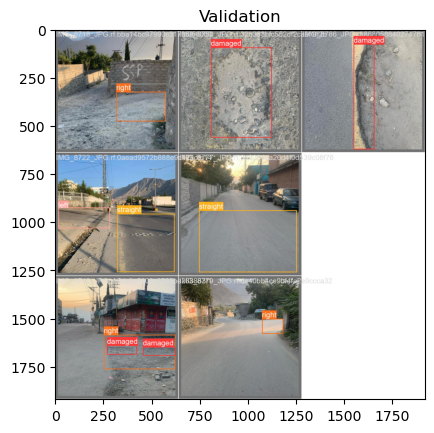

In [5]:
img = Image.open('results/train/exp/val_batch0_labels.jpg')

plt.imshow(img)
plt.title('Validation')
plt.show()

In [1]:
import matplotlib.pyplot as plt
from PIL import Image

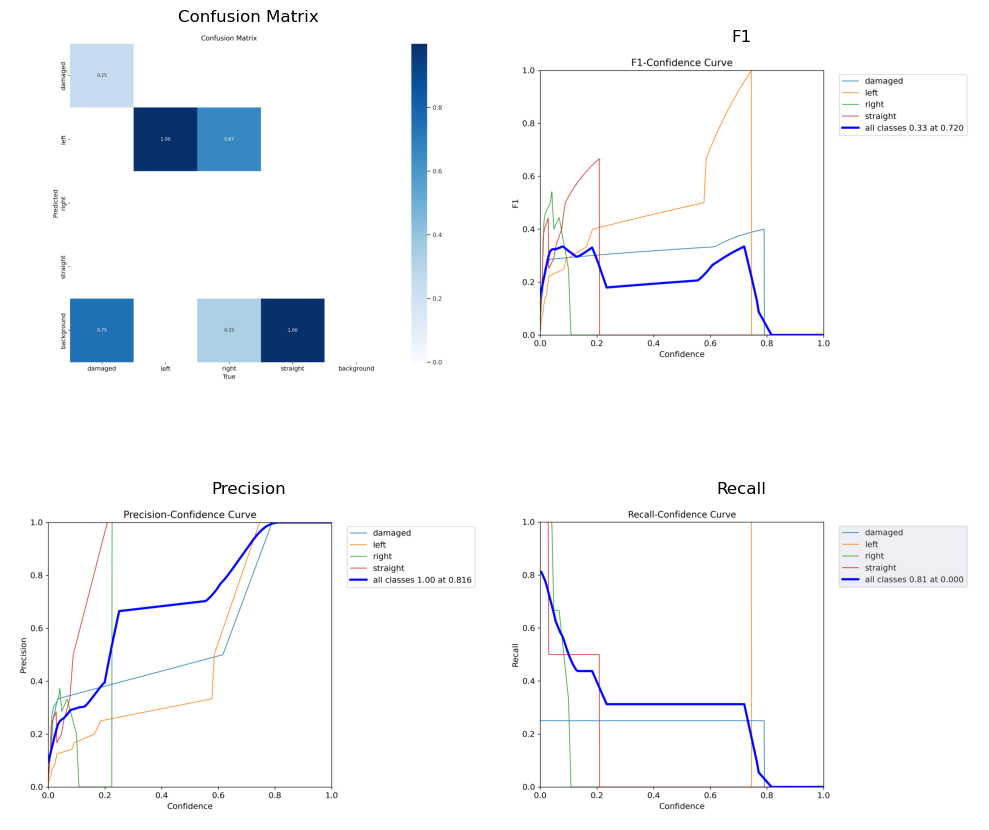

In [2]:
# Displaying Results

files_and_titles = {
    'results/train/exp/confusion_matrix.png': 'Confusion Matrix',
    'results/train/exp/F1_curve.png': 'F1',
    'results/train/exp/P_curve.png': 'Precision',
    'results/train/exp/R_curve.png': 'Recall'
}

fig, axs = plt.subplots(2, 2, figsize=(10, 10))

axs = axs.ravel()

for i, (filename, title) in enumerate(files_and_titles.items()):
    img = Image.open(filename)

    axs[i].imshow(img)
    axs[i].axis('off')
    axs[i].set_title(title)

plt.tight_layout()
plt.show()

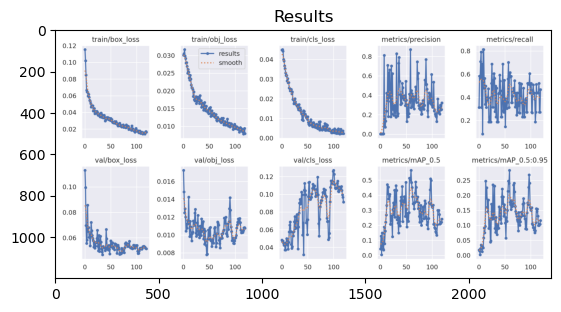

In [4]:
img = Image.open('results/train/exp/results.png')

plt.imshow(img)
plt.title('Results')
plt.show()